In [1]:
# імпорт бібліотек

import numpy as np
import pandas as pd
import plotly.express as px

from ta.trend import IchimokuIndicator, MassIndex, TRIXIndicator
from ta.momentum import StochasticOscillator, rsi
from ta.volume import VolumeWeightedAveragePrice, money_flow_index

import os

In [31]:
!pip install ta

  Created wheel for ta: filename=ta-0.7.0-py3-none-any.whl size=28718 sha256=5280e3bf4e8b222720ad7ac09ce30e1293aa280cd8714abaa00c32f8b43970a2
  Stored in directory: c:\users\adima\appdata\local\pip\cache\wheels\5e\74\e0\72395003bd1d3c8f3f5860c2d180ff15699e47a2733d8ebd38
Successfully built ta


In [2]:
PATH = os.getcwd()

start = '2010-01-04'
end = '2021-04-01'

### Merde GS data to daily dates

In [3]:
# імпорт даних
df = pd.read_csv(PATH + '\data\GSraw.csv', index_col='Date')
df

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,170.050003,174.250000,169.509995,173.080002,146.543259,9135000
2010-01-05,173.000000,176.259995,172.570007,176.139999,149.134033,11659400
2010-01-06,175.380005,175.380005,173.759995,174.259995,147.542236,7381100
2010-01-07,174.320007,178.750000,173.949997,177.669998,150.429474,8727400
2010-01-08,176.330002,177.429993,173.949997,174.309998,147.584579,7268100
...,...,...,...,...,...,...
2021-04-26,341.940002,345.899994,340.890015,343.519989,343.519989,2171500
2021-04-27,344.000000,347.549988,343.660004,346.630005,346.630005,2088600
2021-04-28,348.000000,350.119995,346.089996,348.109985,348.109985,2140900


In [4]:
# обрання часового проміжку
#df = df[['Close']]
df = df[(df.index >= start) & (df.index <= end)]
df

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2010-01-04,170.050003,174.250000,169.509995,173.080002,146.543259,9135000
2010-01-05,173.000000,176.259995,172.570007,176.139999,149.134033,11659400
2010-01-06,175.380005,175.380005,173.759995,174.259995,147.542236,7381100
2010-01-07,174.320007,178.750000,173.949997,177.669998,150.429474,8727400
2010-01-08,176.330002,177.429993,173.949997,174.309998,147.584579,7268100
...,...,...,...,...,...,...
2021-03-26,334.510010,335.450012,322.690002,327.390015,327.390015,3079800
2021-03-29,320.350006,327.760010,317.720001,325.730011,325.730011,4533200
2021-03-30,329.410004,335.750000,328.850006,332.010010,332.010010,2717300


In [5]:
# кіль-ть пропущених даних
df.isna().sum()

Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [6]:
# формування датасету
df_daily = pd.DataFrame()
df_daily['Date'] = pd.date_range(start = start, end = end)
df_daily.set_index('Date', inplace=True)
df_daily

""
Date
2010-01-04
2010-01-05
2010-01-06
2010-01-07
2010-01-08
...
2021-03-28
2021-03-29
2021-03-30


In [7]:
# додання до датасету
df_gs = pd.merge(df_daily, df, how='left', left_index=True, right_index=True)
df_gs.rename({'Close':'GS'},axis=1,inplace=True)
df_gs

,Open,High,Low,GS,Adj Close,Volume
Date,,,,,,
2010-01-04,170.050003,174.250000,169.509995,173.080002,146.543259,9135000.0
2010-01-05,173.000000,176.259995,172.570007,176.139999,149.134033,11659400.0
2010-01-06,175.380005,175.380005,173.759995,174.259995,147.542236,7381100.0
2010-01-07,174.320007,178.750000,173.949997,177.669998,150.429474,8727400.0
2010-01-08,176.330002,177.429993,173.949997,174.309998,147.584579,7268100.0
...,...,...,...,...,...,...
2021-03-28,NaN,NaN,NaN,NaN,NaN,NaN
2021-03-29,320.350006,327.760010,317.720001,325.730011,325.730011,4533200.0
2021-03-30,329.410004,335.750000,328.850006,332.010010,332.010010,2717300.0


In [8]:
# кількість пропущених занченб
df_gs.isna().sum()

Open         1275
High         1275
Low          1275
GS           1275
Adj Close    1275
Volume       1275
dtype: int64

In [9]:
# інфо
df_gs.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4106 entries, 2010-01-04 to 2021-04-01
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       2831 non-null   float64
 1   High       2831 non-null   float64
 2   Low        2831 non-null   float64
 3   GS         2831 non-null   float64
 4   Adj Close  2831 non-null   float64
 5   Volume     2831 non-null   float64
dtypes: float64(6)
memory usage: 384.5 KB


In [10]:
df_gs.index

DatetimeIndex(['2010-01-04', '2010-01-05', '2010-01-06', '2010-01-07',
               '2010-01-08', '2010-01-09', '2010-01-10', '2010-01-11',
               '2010-01-12', '2010-01-13',
               ...
               '2021-03-23', '2021-03-24', '2021-03-25', '2021-03-26',
               '2021-03-27', '2021-03-28', '2021-03-29', '2021-03-30',
               '2021-03-31', '2021-04-01'],
              dtype='datetime64[ns]', name='Date', length=4106, freq=None)

In [11]:
df_gs.columns

Index(['Open', 'High', 'Low', 'GS', 'Adj Close', 'Volume'], dtype='object')

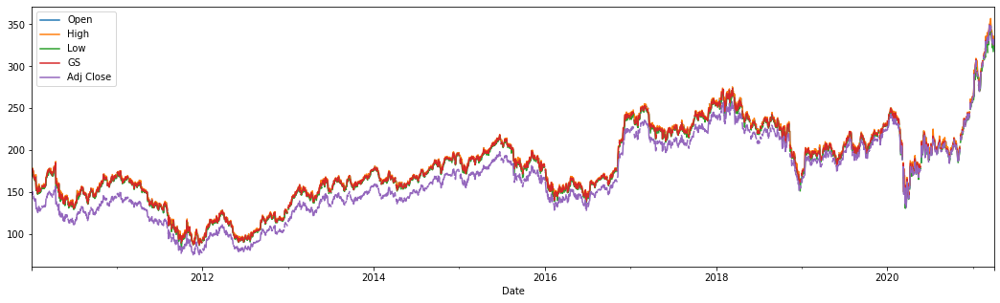

In [12]:
# візуалізація
df_gs[['Open', 'High', 'Low', 'GS', 'Adj Close']].plot(figsize=(18,5));

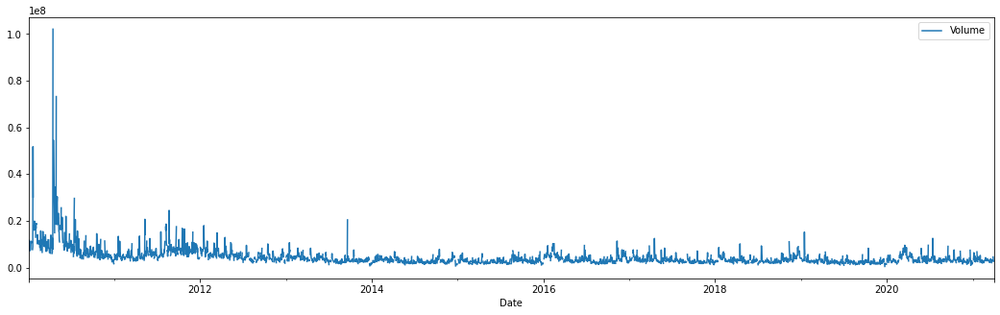

In [13]:
df_gs[['Volume']].plot(figsize=(18,5));

### Fill nans

Open         0
High         0
Low          0
GS           0
Adj Close    0
Volume       0
dtype: int64

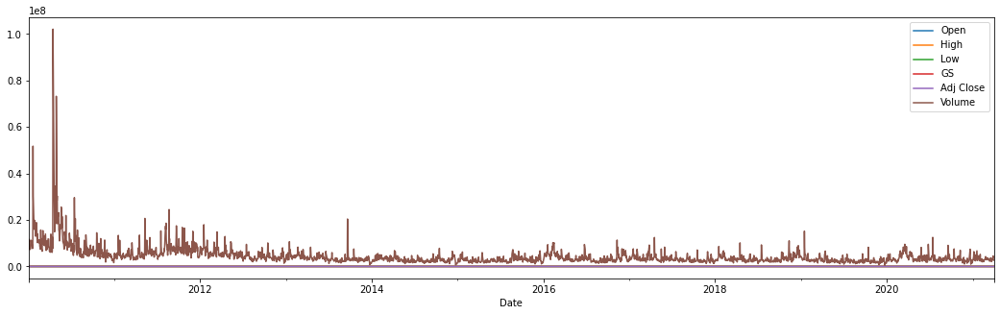

In [14]:
# заповнення пропущених занчень 
df_gs = df_gs.interpolate(method='linear')# методом інтерполяуії
df_gs.plot(figsize=(18,5));
df_gs.isna().sum()

In [15]:
# df_gs.to_csv(PATH + '\data\pre_ready_data\GSready.csv')

In [16]:
df_gs = pd.read_csv(PATH + '\data\pre_ready_data\GSready.csv', index_col='Date')
df_gs.index = pd.to_datetime(df_gs.index)

In [17]:
df_gs

,Open,High,Low,GS,Adj Close,Volume
Date,,,,,,
2010-01-04,170.050003,174.250000,169.509995,173.080002,146.543259,9.135000e+06
2010-01-05,173.000000,176.259995,172.570007,176.139999,149.134033,1.165940e+07
2010-01-06,175.380005,175.380005,173.759995,174.259995,147.542236,7.381100e+06
2010-01-07,174.320007,178.750000,173.949997,177.669998,150.429474,8.727400e+06
2010-01-08,176.330002,177.429993,173.949997,174.309998,147.584579,7.268100e+06
...,...,...,...,...,...,...
2021-03-28,325.070007,330.323344,319.376668,326.283346,326.283346,4.048733e+06
2021-03-29,320.350006,327.760010,317.720001,325.730011,325.730011,4.533200e+06
2021-03-30,329.410004,335.750000,328.850006,332.010010,332.010010,2.717300e+06


### Create TI

In [18]:
def get_technical_indicators(df):
    
    #Simple Movind Average SMA 7 and 21 days
    df['MA7'] = df['GS'].rolling(window=7).mean()
    df['MA21'] = df['GS'].rolling(window=21).mean()
    
    #Exponential Movind Average EMA 
    df['EMA'] = df['GS'].ewm(alpha = 0.3).mean()
    
    #Price Channel
    df['PCh_up'] = df['GS'].rolling(window=20).max()
    df['PCh_dn'] = df['GS'].rolling(window=20).min()
    df['PCc_mid'] = (df['PCh_up'] + df['PCh_dn']) / 2
    
    #Bollinger bands (Линии Боллинджера)
    ma20 = df['GS'].rolling(window=20).mean().to_numpy()
    df['20STD'] = df['GS'].rolling(window=20).std()
    
    df['upper_band'] = ma20 + 2*df['20STD']
    df['lower_band'] = ma20 - 2*df['20STD']
    
    #Ichimoku
    IchimokuIndicatorData = IchimokuIndicator(df['High'], df['Low'], window1 = 9, window2 = 26, window3 = 52, fillna=True)
    df['LeadingSpanA'] = IchimokuIndicatorData.ichimoku_a()
    df['LeadingSpanB'] = IchimokuIndicatorData.ichimoku_b()
    df['BaseLine'] = IchimokuIndicatorData.ichimoku_base_line()
    df['ConversionLine'] = IchimokuIndicatorData.ichimoku_conversion_line()
    
    # Mass Index
    MassIndexData = MassIndex(high = df['High'], low = df['Low'], window_fast = 9, window_slow = 25, fillna=True)
    df['MassIndex'] = MassIndexData.mass_index()
    
    # TRIX Indicator
    TRIXIndicatorData = TRIXIndicator(close= df['GS'], window = 15, fillna=True)
    
    
    
    
    
    #Stochastic Oscillator
    StochasticOscillatorData = StochasticOscillator(high = df['High'], low = df['Low'], close = df['GS'], \
                                                    window = 14, smooth_window = 3, fillna = True)
    df['Stoch'] = StochasticOscillatorData.stoch()
    df['StochSignal'] = StochasticOscillatorData.stoch_signal()
    
    #Relative Strength Index
    df['rsi'] = rsi(df['GS'], window = 14, fillna=True)
    
    #Moving Average Convergence/Divergence MACD
    df['EMA12']= df['GS'].ewm(span = 12).mean()
    df['EMA26']= df['GS'].ewm(span = 26).mean()
    
    df['MACD'] = df['EMA12'] - df['EMA26']
    
    # Previous day price
    df['GSshift1'] = df['GS'].shift(1, fill_value = df['GS'].iloc[0])
    
    #Rate of Change ROC
    df['ROC7'] = (df['GS'].diff(7) / df['GS'].shift(7)) *100
    
    #Momentum Oscillator
    df['momentum'] = (df['GS'] / df['GS'].shift(7)) * 100
    
    
    
    
    # Volume Weighted Average Price
    VolumeWeightedAveragePriceData = VolumeWeightedAveragePrice(high = df['High'], low = df['Low'], close = df['GS'], \
                                                               volume = df['Volume'], window = 14, fillna = True)
    df['VWAP'] = VolumeWeightedAveragePriceData.volume_weighted_average_price()
    
    
    # Money Flow Index (MFI)
    df['MFI'] = money_flow_index(high = df['High'], low = df['Low'], close = df['GS'], \
                                                               volume = df['Volume'], window = 14, fillna = True)
    
    
    
    
    return df
    
    

In [19]:
# застосування функції
df_ti = get_technical_indicators(df_gs)

In [20]:
df_ti.head(10)

,Open,High,Low,GS,Adj Close,Volume,MA7,MA21,EMA,PCh_up,...,StochSignal,rsi,EMA12,EMA26,MACD,GSshift1,ROC7,momentum,VWAP,MFI
Date,,,,,,,,,,,,,,,,,,,,,
2010-01-04,170.050003,174.250000,169.509995,173.080002,146.543259,9135000.0,NaN,NaN,173.080002,NaN,...,75.316524,100.000000,173.080002,173.080002,0.000000,173.080002,NaN,NaN,172.279999,50.000000
2010-01-05,173.000000,176.259995,172.570007,176.139999,149.134033,11659400.0,NaN,NaN,174.880000,NaN,...,86.769403,100.000000,174.737500,174.668847,0.068654,173.080002,NaN,NaN,173.799494,100.000000
2010-01-06,175.380005,175.380005,173.759995,174.259995,147.542236,7381100.0,NaN,NaN,174.596893,NaN,...,81.303059,60.181469,174.551130,174.521950,0.029180,176.139999,NaN,NaN,173.974272,61.305811
2010-01-07,174.320007,178.750000,173.949997,177.669998,150.429474,8727400.0,NaN,NaN,175.810120,NaN,...,85.634775,77.602310,175.535635,175.402007,0.133628,174.259995,NaN,NaN,174.640181,73.562538
2010-01-08,176.330002,177.429993,173.949997,174.309998,147.584579,7268100.0,NaN,NaN,175.269165,NaN,...,70.210033,52.997947,175.202634,175.148765,0.053868,177.669998,NaN,NaN,174.737232,58.315108
2010-01-09,175.906667,176.639995,172.806666,173.393331,146.808476,7413700.0,NaN,NaN,174.631380,NaN,...,60.762385,48.481752,174.762878,174.797166,-0.034288,174.309998,NaN,NaN,174.671519,48.183248
2010-01-10,175.483333,175.849996,171.663335,172.476665,146.032374,7559300.0,174.475713,NaN,173.926953,NaN,...,42.027427,44.406583,174.252717,174.384477,-0.131759,173.393331,NaN,NaN,174.500057,40.965536
2010-01-11,175.059998,175.059998,170.520004,171.559998,145.256271,7704900.0,174.258569,NaN,173.173427,NaN,...,32.106797,40.720500,173.690788,173.929383,-0.238595,172.476665,-0.878209,99.121791,174.255702,35.565130
2010-01-12,170.009995,170.479996,167.029999,167.820007,142.089661,10360100.0,173.069999,NaN,171.499867,NaN,...,20.344549,29.837952,172.529339,173.023840,-0.494501,171.559998,-4.723511,95.276489,173.475784,30.314390


In [21]:
# кількість пропущених значень
df_ti.isna().sum()

Open               0
High               0
Low                0
GS                 0
Adj Close          0
Volume             0
MA7                6
MA21              20
EMA                0
PCh_up            19
PCh_dn            19
PCc_mid           19
20STD             19
upper_band        19
lower_band        19
LeadingSpanA       0
LeadingSpanB       0
BaseLine           0
ConversionLine     0
MassIndex          0
Stoch              0
StochSignal        0
rsi                0
EMA12              0
EMA26              0
MACD               0
GSshift1           0
ROC7               7
momentum           7
VWAP               0
MFI                0
dtype: int64

In [22]:
df_ti.columns

Index(['Open', 'High', 'Low', 'GS', 'Adj Close', 'Volume', 'MA7', 'MA21',
       'EMA', 'PCh_up', 'PCh_dn', 'PCc_mid', '20STD', 'upper_band',
       'lower_band', 'LeadingSpanA', 'LeadingSpanB', 'BaseLine',
       'ConversionLine', 'MassIndex', 'Stoch', 'StochSignal', 'rsi', 'EMA12',
       'EMA26', 'MACD', 'GSshift1', 'ROC7', 'momentum', 'VWAP', 'MFI'],
      dtype='object')

In [23]:
# візуалізація тех індикаторів
def plot_ti(df):
    
    fig = px.line(df, x=df.index, y = df.columns, title='Tech Indicators')
    fig.show()
        
plot_ti(df_ti[['GS','MA7', 'MA21','EMA']])

In [24]:
# візуалізація тех індикаторів
plot_ti(df_ti[['GS','PCh_up', 'PCh_dn', 'PCc_mid']])

In [25]:
# візуалізація тех індикаторів
plot_ti(df_ti[['GS','20STD', 'upper_band',
       'lower_band']])

In [26]:
# візуалізація тех індикаторів
plot_ti(df_ti[['GS','LeadingSpanA', 'LeadingSpanB', 'BaseLine','ConversionLine']])

In [27]:
# візуалізація тех індикаторів
plot_ti(df_ti[['GS','MassIndex', 'Stoch', 'StochSignal', 'rsi']])

In [28]:
# візуалізація тех індикаторів
plot_ti(df_ti[['GS','EMA12','EMA26', 'MACD']])

In [29]:
# візуалізація тех індикаторів
plot_ti(df_ti[['GS','ROC7', 'momentum', 'VWAP', 'MFI']])

### Fill Nan

In [86]:
# df_ti[df_ti.index<='2010-03-01'].plot(figsize=(10,5));

In [87]:
df_ti.isna().sum()

Open               0
High               0
Low                0
GS                 0
Adj Close          0
Volume             0
MA7                6
MA21              20
EMA                0
PCh_up            19
PCh_dn            19
PCc_mid           19
20STD             19
upper_band        19
lower_band        19
LeadingSpanA       0
LeadingSpanB       0
BaseLine           0
ConversionLine     0
MassIndex          0
Stoch              0
StochSignal        0
rsi                0
EMA12              0
EMA26              0
MACD               0
GSshift1           0
ROC7               7
momentum           7
VWAP               0
MFI                0
dtype: int64

In [88]:
df_ti.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 4106 entries, 2010-01-04 to 2021-04-01
Data columns (total 31 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Open            4106 non-null   float64
 1   High            4106 non-null   float64
 2   Low             4106 non-null   float64
 3   GS              4106 non-null   float64
 4   Adj Close       4106 non-null   float64
 5   Volume          4106 non-null   float64
 6   MA7             4100 non-null   float64
 7   MA21            4086 non-null   float64
 8   EMA             4106 non-null   float64
 9   PCh_up          4087 non-null   float64
 10  PCh_dn          4087 non-null   float64
 11  PCc_mid         4087 non-null   float64
 12  20STD           4087 non-null   float64
 13  upper_band      4087 non-null   float64
 14  lower_band      4087 non-null   float64
 15  LeadingSpanA    4106 non-null   float64
 16  LeadingSpanB    4106 non-null   float64
 17  BaseLine       

In [97]:
# колонки з пустими значеннями
cols_with_na = df_ti.isna().sum()[df_ti.isna().sum() != 0].index.tolist()
cols_with_na

['MA7',
 'MA21',
 'PCh_up',
 'PCh_dn',
 'PCc_mid',
 '20STD',
 'upper_band',
 'lower_band',
 'ROC7',
 'momentum']

In [130]:
# !pip install scipy

In [72]:
df_ti.head(5)

,Open,High,Low,GS,Adj Close,Volume,MA7,MA21,EMA,PCh_up,...,StochSignal,rsi,EMA12,EMA26,MACD,GSshift1,ROC7,momentum,VWAP,MFI
Date,,,,,,,,,,,,,,,,,,,,,
2010-01-04,170.050003,174.250000,169.509995,173.080002,146.543259,9135000.0,NaN,NaN,173.080002,NaN,...,75.316524,100.000000,173.080002,173.080002,0.000000,173.080002,NaN,NaN,172.279999,50.000000
2010-01-05,173.000000,176.259995,172.570007,176.139999,149.134033,11659400.0,NaN,NaN,174.880000,NaN,...,86.769403,100.000000,174.737500,174.668847,0.068654,173.080002,NaN,NaN,173.799494,100.000000
2010-01-06,175.380005,175.380005,173.759995,174.259995,147.542236,7381100.0,NaN,NaN,174.596893,NaN,...,81.303059,60.181469,174.551130,174.521950,0.029180,176.139999,NaN,NaN,173.974272,61.305811
2010-01-07,174.320007,178.750000,173.949997,177.669998,150.429474,8727400.0,NaN,NaN,175.810120,NaN,...,85.634775,77.602310,175.535635,175.402007,0.133628,174.259995,NaN,NaN,174.640181,73.562538
2010-01-08,176.330002,177.429993,173.949997,174.309998,147.584579,7268100.0,NaN,NaN,175.269165,NaN,...,70.210033,52.997947,175.202634,175.148765,0.053868,177.669998,NaN,NaN,174.737232,58.315108


In [73]:
# заповнення пробілів методом бекфілл
filled_df = df_ti.fillna(method='bfill')
filled_df.head(10)

,Open,High,Low,GS,Adj Close,Volume,MA7,MA21,EMA,PCh_up,...,StochSignal,rsi,EMA12,EMA26,MACD,GSshift1,ROC7,momentum,VWAP,MFI
Date,,,,,,,,,,,,,,,,,,,,,
2010-01-04,170.050003,174.250000,169.509995,173.080002,146.543259,9135000.0,174.475713,167.636428,173.080002,177.669998,...,75.316524,100.000000,173.080002,173.080002,0.000000,173.080002,-0.878209,99.121791,172.279999,50.000000
2010-01-05,173.000000,176.259995,172.570007,176.139999,149.134033,11659400.0,174.475713,167.636428,174.880000,177.669998,...,86.769403,100.000000,174.737500,174.668847,0.068654,173.080002,-0.878209,99.121791,173.799494,100.000000
2010-01-06,175.380005,175.380005,173.759995,174.259995,147.542236,7381100.0,174.475713,167.636428,174.596893,177.669998,...,81.303059,60.181469,174.551130,174.521950,0.029180,176.139999,-0.878209,99.121791,173.974272,61.305811
2010-01-07,174.320007,178.750000,173.949997,177.669998,150.429474,8727400.0,174.475713,167.636428,175.810120,177.669998,...,85.634775,77.602310,175.535635,175.402007,0.133628,174.259995,-0.878209,99.121791,174.640181,73.562538
2010-01-08,176.330002,177.429993,173.949997,174.309998,147.584579,7268100.0,174.475713,167.636428,175.269165,177.669998,...,70.210033,52.997947,175.202634,175.148765,0.053868,177.669998,-0.878209,99.121791,174.737232,58.315108
2010-01-09,175.906667,176.639995,172.806666,173.393331,146.808476,7413700.0,174.475713,167.636428,174.631380,177.669998,...,60.762385,48.481752,174.762878,174.797166,-0.034288,174.309998,-0.878209,99.121791,174.671519,48.183248
2010-01-10,175.483333,175.849996,171.663335,172.476665,146.032374,7559300.0,174.475713,167.636428,173.926953,177.669998,...,42.027427,44.406583,174.252717,174.384477,-0.131759,173.393331,-0.878209,99.121791,174.500057,40.965536
2010-01-11,175.059998,175.059998,170.520004,171.559998,145.256271,7704900.0,174.258569,167.636428,173.173427,177.669998,...,32.106797,40.720500,173.690788,173.929383,-0.238595,172.476665,-0.878209,99.121791,174.255702,35.565130
2010-01-12,170.009995,170.479996,167.029999,167.820007,142.089661,10360100.0,173.069999,167.636428,171.499867,177.669998,...,20.344549,29.837952,172.529339,173.023840,-0.494501,171.559998,-4.723511,95.276489,173.475784,30.314390


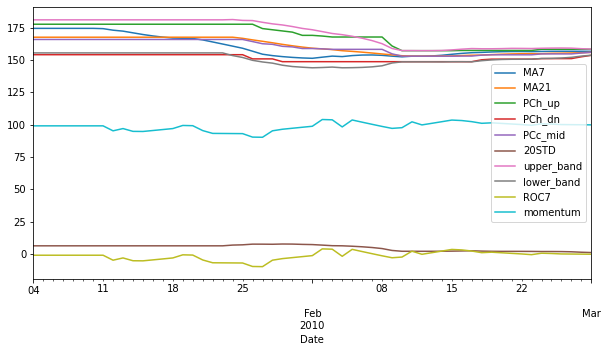

In [98]:
# візуалізація
filled_df[cols_with_na][filled_df.index<='2010-03-01'].plot(figsize=(10,5));

In [99]:
# plot_ti(filled_df)

In [100]:
# збереження
filled_df.to_csv(PATH + '\data\pre_ready_data\\tech_info.csv')